In [1]:
import os
import tensorflow as tf
import tensorflow_datasets as tfds
import numpy as np
from collections import defaultdict
from IPython.display import Audio, display
from scipy.io import wavfile
from scipy.cluster.vq import kmeans2
from sklearn.decomposition import PCA
from matplotlib import pyplot as plt
from notebooks.tf.scheduler import SGDRScheduler

In [2]:
source_files = [f"./data/highfreq/{i}.wav" for i in range(1, 5)]

audio_files_data = np.array([], np.float32)
audio_files_indexes = []

sample_rate = 32000
sample_start = sample_rate * 60
sample_end = sample_rate * 70

for source in source_files:
    audio_files_indexes.append(len(audio_files_data))
    rate, data = wavfile.read(source)
    assert rate == sample_rate
    audio_files_data = np.concatenate((audio_files_data, data))

print("Sample rate:", sample_rate)

Sample rate: 32000


In [3]:
for index in audio_files_indexes:
    start = index + sample_start
    end = index + sample_end
    display(Audio(audio_files_data[start:end], rate=sample_rate))

In [4]:
def compress_with_pca(data, components, block_size=1024):
    samples = len(data)
    leftover = block_size - samples % block_size
    padded = np.lib.pad(data, (0, leftover), "constant", constant_values=0)
    
    reshaped = padded.reshape((len(padded) // block_size, block_size))
    
    pca = PCA(n_components=components)
    pca.fit(reshaped)
    
    transformed = pca.transform(reshaped)
    reconstructed = pca.inverse_transform(transformed).reshape((len(padded)))
    return pca, transformed, reconstructed

In [5]:
COMPONENT_COUNT = 50
SAMPLE_SIZE = 320

pca, transformed, constructed = compress_with_pca(
    audio_files_data, COMPONENT_COUNT, SAMPLE_SIZE
)
print(f"PCA Transformed audio shape: {transformed.shape}")
Audio(constructed[sample_start:sample_end], rate=sample_rate)

PCA Transformed audio shape: (75406, 50)


In [6]:
k = 2048
centroid, label = kmeans2(transformed, k, minit='points')

In [7]:
# counts = np.bincount(label)
# np.amax(counts)
print(len(audio_files_data))
print(len(constructed))
print(len(transformed))
print(len(label))
print(len(centroid))

24129783
24129920
75406
75406
2048


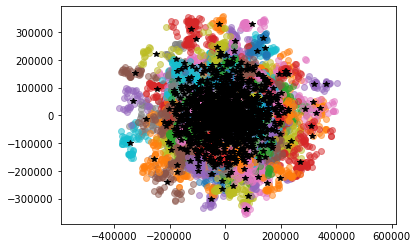

In [8]:
for i in range(k):
    w = transformed[label == i][:1000]
    plt.plot(w[:, 0], w[:, 1], "o", alpha=0.5, label=f"cluster {i}")

plt.plot(centroid[:, 0], centroid[:, 1], 'k*', label='centroids')
plt.axis('equal')
plt.show()

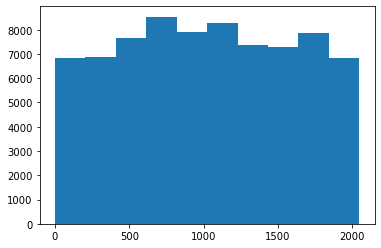

In [9]:
plt.hist(label)
plt.show()

In [10]:
BATCH_COUNT = min(len(label), len(audio_files_data) // SAMPLE_SIZE)

data_scale = np.amax(np.abs(audio_files_data))
normalized_data = audio_files_data / data_scale

batched = (normalized_data[:BATCH_COUNT * SAMPLE_SIZE]).reshape((
    BATCH_COUNT, SAMPLE_SIZE
))
label = label[:BATCH_COUNT]
print(label.shape)
print(batched.shape)

(75405,)
(75405, 320)


In [11]:
label[500:530]

array([1677,  141,  141,  141, 1418, 1418, 1228, 1544, 1228, 1228, 1084,
       1098, 1098, 1100,  364,  364, 1037, 1037, 1037, 1831,  316, 1974,
        362,  347,  347, 1315, 1315, 1315, 1315,  371])

In [12]:
grouped_by_label = defaultdict(list)
for index, data in enumerate(batched):
    grouped_by_label[label[index]].append(data)

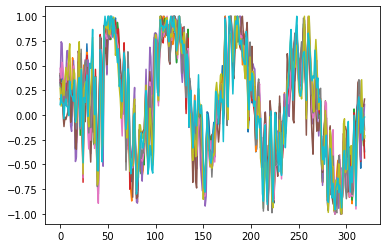

None

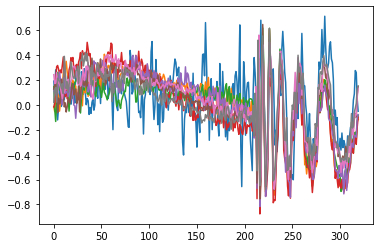

None

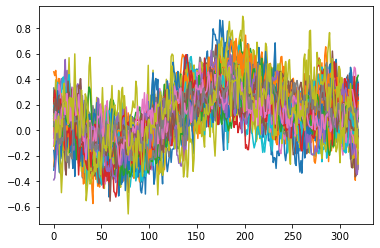

None

In [13]:
for entry in grouped_by_label[0]:
    plt.plot(entry)
display(plt.show())
for entry in grouped_by_label[2]:
    plt.plot(entry)
display(plt.show())
for entry in grouped_by_label[1000]:
    plt.plot(entry)
display(plt.show())

In [14]:
TRAINING_BATCH_SIZE = 64

In [15]:
def process_input_data(input_data):
    input_data = tf.data.Dataset.from_tensor_slices(input_data)
    input_data = input_data.window(3, shift=1, drop_remainder=True)
    input_data = input_data.flat_map(lambda window: window)
    input_data = input_data.map(lambda x: tf.one_hot(x, depth=k))
    input_data = input_data.batch(3, drop_remainder=True)
    return input_data

def process_datasets(input_data, target_data):
    input_data = process_input_data(input_data)
    target_data = tf.data.Dataset.from_tensor_slices(target_data)
    target_data = target_data.skip(1)
    return (input_data, target_data)

def test_process_datasets():
    a1, a2 = process_datasets(np.array(range(100)), np.array(range(100)))
    a3 = tf.data.Dataset.zip((a1, a2))

    for index, (group_input, group_target) in enumerate(a3.take(100)):
        assert np.argmax(group_input[0]) == index + 0
        assert np.argmax(group_input[1]) == index + 1
        assert np.argmax(group_input[2]) == index + 2
        assert group_target == index + 1


test_process_datasets()

label_set, sample_set = process_datasets(label, batched)
zipped_set = tf.data.Dataset.zip((
    label_set, sample_set,
))

for group_input, group_target in zipped_set.take(5):
    print(np.argmax(group_input, axis=1))

training_set = zipped_set.batch(TRAINING_BATCH_SIZE, drop_remainder=True)
training_set

[807 807 807]
[807 807 791]
[807 791 368]
[ 791  368 2007]
[ 368 2007  559]


<BatchDataset shapes: ((64, 3, 2048), (64, 320)), types: (tf.float32, tf.float32)>

In [16]:
for labels, samples in training_set.take(1):
    ex_sample = samples[63]
    audiotest = np.array([])
    for entry in samples:
        audiotest = np.concatenate((audiotest, entry))
    print(audiotest.shape)
    print(np.argmax(labels[63], axis=1))
    display(Audio(audiotest * data_scale, rate=sample_rate))

(20480,)
[ 488  595 1974]


In [17]:
def build_model(lc, h1, h2, oc):
    model = tf.keras.Sequential([
        tf.keras.layers.InputLayer(
            batch_size=TRAINING_BATCH_SIZE,
            input_shape=(3, lc,),
            dtype=tf.float32,
        ),
        tf.keras.layers.Dense(
            units=h1,
            dtype=tf.float32,
        ),
        tf.keras.layers.PReLU(),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(
            units=h2,
            dtype=tf.float32,
        ),
        tf.keras.layers.PReLU(),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Dense(
            units=oc,
            dtype=tf.float32,
        ),
    ])
    return model, f"./training-checkpoints/k-means-audio-4-3-{lc}-{h1}-{h2}-{oc}"

model, checkpoint_dir = build_model(
    lc=k,
    h1=k,
    h2=k * 2,
    oc=SAMPLE_SIZE,
)
model.build()

latest_checkpoint = tf.train.latest_checkpoint(checkpoint_dir)
if latest_checkpoint:
    model.load_weights(latest_checkpoint)

model.summary()
model.compile("adam", loss=tf.keras.losses.MSE)

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (64, 3, 2048)             4196352   
_________________________________________________________________
p_re_lu (PReLU)              (64, 3, 2048)             6144      
_________________________________________________________________
batch_normalization (BatchNo (64, 3, 2048)             8192      
_________________________________________________________________
flatten (Flatten)            (64, 6144)                0         
_________________________________________________________________
dense_1 (Dense)              (64, 4096)                25169920  
_________________________________________________________________
p_re_lu_1 (PReLU)            (64, 4096)                4096      
_________________________________________________________________
batch_normalization_1 (Batch (64, 4096)                1

In [44]:
checkpoint_prefix = os.path.abspath(
    os.path.join(checkpoint_dir, "ckpt_{epoch}")
)

checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_prefix,
    save_weights_only=True,
    monitor="loss",
    save_best_only=True,
    period=10,
)

learningrate_callback = SGDRScheduler(
    min_lr=1e-7,
    max_lr=1e-3,
    steps_per_epoch=54,
    lr_decay=0.9,
    cycle_length=5,
    mult_factor=1.5
)

In [45]:
EPOCHS = 400
history = model.fit(
    training_set,
    epochs=EPOCHS,
    callbacks=[
        checkpoint_callback,
        learningrate_callback,
    ],
)

Epoch 1/400
1178/1178 [==============================] - 20s 17ms/step - loss: 0.0032
Epoch 2/400
1178/1178 [==============================] - 18s 16ms/step - loss: 0.0032
Epoch 3/400
1178/1178 [==============================] - 19s 16ms/step - loss: 0.0030
Epoch 4/400
1178/1178 [==============================] - 19s 16ms/step - loss: 0.0032
Epoch 5/400
1178/1178 [==============================] - 19s 16ms/step - loss: 0.0031
Epoch 6/400
1178/1178 [==============================] - 18s 16ms/step - loss: 0.0027
Epoch 7/400
1178/1178 [==============================] - 19s 16ms/step - loss: 0.0024
Epoch 8/400
1178/1178 [==============================] - 19s 16ms/step - loss: 0.0027
Epoch 9/400
1178/1178 [==============================] - 19s 16ms/step - loss: 0.0026
Epoch 10/400
1178/1178 [==============================] - 25s 22ms/step - loss: 0.0024
Epoch 11/400
1178/1178 [==============================] - 19s 16ms/step - loss: 0.0028
Epoch 12/400
1178/1178 [============================

1178/1178 [==============================] - 19s 16ms/step - loss: 0.0022
Epoch 96/400
1178/1178 [==============================] - 19s 16ms/step - loss: 0.0018
Epoch 97/400
1178/1178 [==============================] - 19s 16ms/step - loss: 0.0020
Epoch 98/400
1178/1178 [==============================] - 18s 15ms/step - loss: 0.0020
Epoch 99/400
1178/1178 [==============================] - 19s 16ms/step - loss: 0.0021
Epoch 100/400
1178/1178 [==============================] - 24s 21ms/step - loss: 0.0018
Epoch 101/400
1178/1178 [==============================] - 19s 16ms/step - loss: 0.0020
Epoch 102/400
1178/1178 [==============================] - 18s 16ms/step - loss: 0.0020
Epoch 103/400
1178/1178 [==============================] - 19s 16ms/step - loss: 0.0020
Epoch 104/400
1178/1178 [==============================] - 19s 16ms/step - loss: 0.0018
Epoch 105/400
1178/1178 [==============================] - 19s 16ms/step - loss: 0.0019
Epoch 106/400
1178/1178 [=========================

1178/1178 [==============================] - 19s 16ms/step - loss: 0.0016
Epoch 189/400
1178/1178 [==============================] - 19s 16ms/step - loss: 0.0016
Epoch 190/400
1178/1178 [==============================] - 19s 16ms/step - loss: 0.0018
Epoch 191/400
1178/1178 [==============================] - 19s 16ms/step - loss: 0.0019
Epoch 192/400
1178/1178 [==============================] - 19s 16ms/step - loss: 0.0019
Epoch 193/400
1178/1178 [==============================] - 19s 16ms/step - loss: 0.0017
Epoch 194/400
1178/1178 [==============================] - 18s 16ms/step - loss: 0.0017
Epoch 195/400
1178/1178 [==============================] - 19s 16ms/step - loss: 0.0019
Epoch 196/400
1178/1178 [==============================] - 19s 16ms/step - loss: 0.0017
Epoch 197/400
1178/1178 [==============================] - 19s 16ms/step - loss: 0.0016
Epoch 198/400
1178/1178 [==============================] - 19s 16ms/step - loss: 0.0017
Epoch 199/400
1178/1178 [=====================

1178/1178 [==============================] - 19s 16ms/step - loss: 0.0018
Epoch 282/400
1178/1178 [==============================] - 18s 16ms/step - loss: 0.0017
Epoch 283/400
1178/1178 [==============================] - 19s 16ms/step - loss: 0.0016
Epoch 284/400
1178/1178 [==============================] - 18s 16ms/step - loss: 0.0016
Epoch 285/400
1178/1178 [==============================] - 19s 16ms/step - loss: 0.0017
Epoch 286/400
1178/1178 [==============================] - 19s 16ms/step - loss: 0.0018
Epoch 287/400
1178/1178 [==============================] - 19s 16ms/step - loss: 0.0016
Epoch 288/400
1178/1178 [==============================] - 19s 16ms/step - loss: 0.0016
Epoch 289/400
1178/1178 [==============================] - 19s 16ms/step - loss: 0.0016
Epoch 290/400
1178/1178 [==============================] - 24s 21ms/step - loss: 0.0016
Epoch 291/400
1178/1178 [==============================] - 19s 16ms/step - loss: 0.0017
Epoch 292/400
1178/1178 [=====================

1178/1178 [==============================] - 18s 16ms/step - loss: 0.0016
Epoch 375/400
1178/1178 [==============================] - 19s 16ms/step - loss: 0.0017
Epoch 376/400
1178/1178 [==============================] - 19s 16ms/step - loss: 0.0017
Epoch 377/400
1178/1178 [==============================] - 19s 16ms/step - loss: 0.0016
Epoch 378/400
1178/1178 [==============================] - 19s 16ms/step - loss: 0.0015
Epoch 379/400
1178/1178 [==============================] - 19s 16ms/step - loss: 0.0015
Epoch 380/400
1178/1178 [==============================] - 19s 16ms/step - loss: 0.0016
Epoch 381/400
1178/1178 [==============================] - 19s 16ms/step - loss: 0.0017
Epoch 382/400
1178/1178 [==============================] - 19s 16ms/step - loss: 0.0018
Epoch 383/400
1178/1178 [==============================] - 19s 16ms/step - loss: 0.0018
Epoch 384/400
1178/1178 [==============================] - 19s 16ms/step - loss: 0.0017
Epoch 385/400
1178/1178 [=====================

In [46]:
labels_test = label_set.batch(TRAINING_BATCH_SIZE, drop_remainder=True)
labels_count = len(label) - 1
batch_count = labels_count // TRAINING_BATCH_SIZE

outputs = []

print("Processing", batch_count, "batches")

for index, batch in enumerate(labels_test):
    res = model(batch).numpy().flatten()
    outputs.append(res)
    if index % 100 == 0:
        percentage = "{:.1%}".format(index / batch_count)
        print(f"Processing... {index + 1} / {batch_count} ({percentage})")

output = np.array(outputs).flatten()
output = output * data_scale

Processing 1178 batches
Processing... 1 / 1178 (0.0%)
Processing... 101 / 1178 (8.5%)
Processing... 201 / 1178 (17.0%)
Processing... 301 / 1178 (25.5%)
Processing... 401 / 1178 (34.0%)
Processing... 501 / 1178 (42.4%)
Processing... 601 / 1178 (50.9%)
Processing... 701 / 1178 (59.4%)
Processing... 801 / 1178 (67.9%)
Processing... 901 / 1178 (76.4%)
Processing... 1001 / 1178 (84.9%)
Processing... 1101 / 1178 (93.4%)


In [47]:
for index in audio_files_indexes:
    start = index + sample_start
    end = index + sample_end
    display(Audio(output[start:end + 320000], rate=sample_rate))
# Audio(output[sample_start:sample_end] * data_scale, rate=sample_rate)

In [22]:
rnn_checkpoint_dir = "./training-checkpoints/k-means-audio-dictionary-rnn"
last_rnn_checkpoint = tf.train.latest_checkpoint(rnn_checkpoint_dir)

RNN_BATCH_SIZE = 16
RNN_UNITS = 1024
EMBEDDING_UNITS = 64
VOCABULARY_SIZE = k

def build_rnn(vocabulary_size, embedding_dimension, rnn_units, batch_size):
    model = tf.keras.Sequential([
        tf.keras.layers.Embedding(
            vocabulary_size,
            embedding_dimension,
            batch_input_shape=[batch_size, None],
            name="embedding",
        ),
        tf.keras.layers.GRU(
            rnn_units,
            return_sequences=True,
            stateful=True,
            recurrent_initializer="glorot_uniform",
        ),
        tf.keras.layers.GRU(
            rnn_units,
            return_sequences=True,
            stateful=True,
            recurrent_initializer="glorot_uniform",
        ),
        tf.keras.layers.Dense(
            vocabulary_size,
            name="out",
        ),
    ], "RNN")
    return model

rnn = build_rnn(
    vocabulary_size=VOCABULARY_SIZE,
    embedding_dimension=EMBEDDING_UNITS,
    rnn_units=RNN_UNITS,
    batch_size=RNN_BATCH_SIZE,
)
if last_rnn_checkpoint:
    print("Loaded!")
    rnn.load_weights(last_rnn_checkpoint)

# rnn.build()
rnn.summary()

def rnn_loss(labels, logits):
    return tf.keras.losses.sparse_categorical_crossentropy(
        labels,
        logits,
        from_logits=True,
    )

rnn.compile("adam", loss=rnn_loss)

Model: "RNN"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding (Embedding)        (16, None, 64)            131072    
_________________________________________________________________
gru (GRU)                    (16, None, 1024)          3348480   
_________________________________________________________________
gru_1 (GRU)                  (16, None, 1024)          6297600   
_________________________________________________________________
out (Dense)                  (16, None, 2048)          2099200   
Total params: 11,876,352
Trainable params: 11,876,352
Non-trainable params: 0
_________________________________________________________________


In [23]:
RNN_SEQUENCE_LENGTH = 200

print("Training data sequences:", len(label) // RNN_SEQUENCE_LENGTH)
rnn_dataset = tf.data.Dataset.from_tensor_slices(label)
rnn_sequences = rnn_dataset.batch(
    RNN_SEQUENCE_LENGTH + 1,
    drop_remainder=True
)

def split_input_target(sequence):
    input_data = sequence[:-1]
    target_data = sequence[1:]
    return input_data, target_data

rnn_sequences = rnn_sequences.map(split_input_target)
rnn_sequences

Training data sequences: 377


<MapDataset shapes: ((200,), (200,)), types: (tf.int32, tf.int32)>

In [24]:
rnn_training_data = (
    rnn_sequences
    .shuffle(1024)
    .batch(RNN_BATCH_SIZE, drop_remainder=True)
)

rnn_training_data

<BatchDataset shapes: ((16, 200), (16, 200)), types: (tf.int32, tf.int32)>

In [25]:
def convert_integers_to_audio(integers):
    integers = process_input_data(integers)
    batched = integers.batch(TRAINING_BATCH_SIZE, drop_remainder=True)
    
    result = []
    for batch in batched:
        decoded = model(batch).numpy().flatten()
        result.extend(decoded)
    return np.array(result) * data_scale

In [26]:
# print(label.shape)
testaudio = convert_integers_to_audio(label)

In [27]:
display(Audio(testaudio[sample_start:sample_end], rate=sample_rate))

In [35]:
rnn_checkpoint_prefix = os.path.abspath(
    os.path.join(rnn_checkpoint_dir, "ckpt_{epoch}")
)

rnn_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath=rnn_checkpoint_prefix,
    save_weights_only=True,
    monitor="loss",
    save_best_only=True,
    period=100,
)
rnn_lr_schedule = SGDRScheduler(
    min_lr=1e-7,
    max_lr=1e-3,
    steps_per_epoch=54,
    lr_decay=0.9,
    cycle_length=5,
    mult_factor=1.5
)

In [36]:
EPOCHS = 1000
history = rnn.fit(
    rnn_training_data,
    epochs=EPOCHS,
    callbacks=[
        rnn_checkpoint_callback,
        rnn_lr_schedule,
    ],
)

Train for 23 steps
Epoch 1/1000
23/23 [==============================] - 6s 267ms/step - loss: 0.0441
Epoch 2/1000
23/23 [==============================] - 6s 267ms/step - loss: 0.0415
Epoch 3/1000
23/23 [==============================] - 7s 283ms/step - loss: 0.0376
Epoch 4/1000
23/23 [==============================] - 6s 271ms/step - loss: 0.0387
Epoch 5/1000
23/23 [==============================] - 7s 297ms/step - loss: 0.0403
Epoch 6/1000
23/23 [==============================] - 7s 303ms/step - loss: 0.0385
Epoch 7/1000
23/23 [==============================] - 6s 281ms/step - loss: 0.0363
Epoch 8/1000
23/23 [==============================] - 6s 281ms/step - loss: 0.0373
Epoch 9/1000
23/23 [==============================] - 6s 282ms/step - loss: 0.0377
Epoch 10/1000
23/23 [==============================] - 7s 286ms/step - loss: 0.0363
Epoch 11/1000
23/23 [==============================] - 7s 293ms/step - loss: 0.0358
Epoch 12/1000
23/23 [==============================] - 7s 284ms/st

23/23 [==============================] - 6s 275ms/step - loss: 0.0225
Epoch 99/1000
23/23 [==============================] - 6s 277ms/step - loss: 0.0237
Epoch 100/1000
23/23 [==============================] - 10s 425ms/step - loss: 0.0223
Epoch 101/1000
23/23 [==============================] - 6s 282ms/step - loss: 0.0228
Epoch 102/1000
23/23 [==============================] - 6s 278ms/step - loss: 0.0223
Epoch 103/1000
23/23 [==============================] - 6s 281ms/step - loss: 0.0199
Epoch 104/1000
23/23 [==============================] - 6s 280ms/step - loss: 0.0198
Epoch 105/1000
23/23 [==============================] - 6s 276ms/step - loss: 0.0208
Epoch 106/1000
23/23 [==============================] - 6s 282ms/step - loss: 0.0213
Epoch 107/1000
23/23 [==============================] - 6s 275ms/step - loss: 0.0212
Epoch 108/1000
23/23 [==============================] - 6s 277ms/step - loss: 0.0211
Epoch 109/1000
23/23 [==============================] - 6s 278ms/step - loss: 0.

23/23 [==============================] - 6s 275ms/step - loss: 0.0982
Epoch 195/1000
23/23 [==============================] - 6s 267ms/step - loss: 0.0997
Epoch 196/1000
23/23 [==============================] - 7s 304ms/step - loss: 0.0955
Epoch 197/1000
23/23 [==============================] - 7s 286ms/step - loss: 0.0932
Epoch 198/1000
23/23 [==============================] - 7s 284ms/step - loss: 0.0965
Epoch 199/1000
23/23 [==============================] - 7s 289ms/step - loss: 0.0945
Epoch 200/1000
23/23 [==============================] - 6s 278ms/step - loss: 0.0891
Epoch 201/1000
23/23 [==============================] - 7s 310ms/step - loss: 0.0881
Epoch 202/1000
23/23 [==============================] - 7s 291ms/step - loss: 0.0882
Epoch 203/1000
23/23 [==============================] - 7s 283ms/step - loss: 0.0896
Epoch 204/1000
23/23 [==============================] - 7s 284ms/step - loss: 0.0842
Epoch 205/1000
23/23 [==============================] - 6s 282ms/step - loss: 0.

23/23 [==============================] - 7s 285ms/step - loss: 0.0394
Epoch 291/1000
23/23 [==============================] - 6s 282ms/step - loss: 0.0420
Epoch 292/1000
23/23 [==============================] - 7s 284ms/step - loss: 0.0442
Epoch 293/1000
23/23 [==============================] - 7s 290ms/step - loss: 0.0442
Epoch 294/1000
23/23 [==============================] - 7s 286ms/step - loss: 0.0412
Epoch 295/1000
23/23 [==============================] - 7s 287ms/step - loss: 0.0410
Epoch 296/1000
23/23 [==============================] - 7s 285ms/step - loss: 0.0383
Epoch 297/1000
23/23 [==============================] - 7s 283ms/step - loss: 0.0395
Epoch 298/1000
23/23 [==============================] - 7s 286ms/step - loss: 0.0378
Epoch 299/1000
23/23 [==============================] - 6s 282ms/step - loss: 0.0370
Epoch 300/1000
23/23 [==============================] - 7s 284ms/step - loss: 0.0359
Epoch 301/1000
23/23 [==============================] - 6s 282ms/step - loss: 0.

23/23 [==============================] - 7s 287ms/step - loss: 0.0230
Epoch 387/1000
23/23 [==============================] - 7s 292ms/step - loss: 0.0238
Epoch 388/1000
23/23 [==============================] - 6s 281ms/step - loss: 0.0228
Epoch 389/1000
23/23 [==============================] - 7s 290ms/step - loss: 0.0224
Epoch 390/1000
23/23 [==============================] - 7s 286ms/step - loss: 0.0223
Epoch 391/1000
23/23 [==============================] - 7s 289ms/step - loss: 0.0229
Epoch 392/1000
23/23 [==============================] - 7s 292ms/step - loss: 0.0227
Epoch 393/1000
23/23 [==============================] - 7s 305ms/step - loss: 0.0222
Epoch 394/1000
23/23 [==============================] - 7s 291ms/step - loss: 0.0233
Epoch 395/1000
23/23 [==============================] - 7s 299ms/step - loss: 0.0214
Epoch 396/1000
23/23 [==============================] - 7s 285ms/step - loss: 0.0211
Epoch 397/1000
23/23 [==============================] - 7s 286ms/step - loss: 0.

KeyboardInterrupt: 

In [37]:
rnn_generator = build_rnn(
    vocabulary_size=VOCABULARY_SIZE,
    embedding_dimension=EMBEDDING_UNITS,
    rnn_units=RNN_UNITS,
    batch_size=1,
)
rnn_generator.load_weights(tf.train.latest_checkpoint(rnn_checkpoint_dir))
rnn_generator.build()
rnn_generator.summary()

Model: "RNN"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding (Embedding)        (1, None, 64)             131072    
_________________________________________________________________
gru_4 (GRU)                  (1, None, 1024)           3348480   
_________________________________________________________________
gru_5 (GRU)                  (1, None, 1024)           6297600   
_________________________________________________________________
out (Dense)                  (1, None, 2048)           2099200   
Total params: 11,876,352
Trainable params: 11,876,352
Non-trainable params: 0
_________________________________________________________________


In [38]:
def generate_audio_integers(model, input_eval, count=3200):
    generated_output = []
    
    temperature = 1.0
    
    input_eval = tf.expand_dims(input_eval, 0)
    
    model.reset_states()
    for i in range(count):
        predictions = model(input_eval)
        predictions = tf.squeeze(predictions, 0)

        predictions /= temperature
        predicted_id = tf.random.categorical(predictions, num_samples=1)
        predicted_id = predicted_id[-1, 0].numpy()
        
        # Pass in the predicted character as input on the next round
        input_eval = tf.expand_dims([predicted_id], 0)
        generated_output.append(predicted_id)
    
    return generated_output

In [39]:
generated = generate_audio_integers(rnn_generator, range(10), count=64 * 100)
audio_data = convert_integers_to_audio(generated)
print(audio_data.shape)

(2027520,)


In [40]:
Audio(audio_data, rate=sample_rate)